In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.graph_objs as go
import json
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
data = pd.read_csv('INvideos.csv')
data.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,kzwfHumJyYc,17.14.11,Sharry Mann: Cute Munda ( Song Teaser) | Parmi...,Lokdhun Punjabi,1,2017-11-12T12:20:39.000Z,"sharry mann|""sharry mann new song""|""sharry man...",1096327,33966,798,882,https://i.ytimg.com/vi/kzwfHumJyYc/default.jpg,False,False,False,Presenting Sharry Mann latest Punjabi Song Cu...
1,zUZ1z7FwLc8,17.14.11,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं...",HJ NEWS,25,2017-11-13T05:43:56.000Z,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर द...",590101,735,904,0,https://i.ytimg.com/vi/zUZ1z7FwLc8/default.jpg,True,False,False,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दं..."
2,10L1hZ9qa58,17.14.11,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,TFPC,24,2017-11-12T15:48:08.000Z,Stylish Star Allu Arjun @ ChaySam Wedding Rece...,473988,2011,243,149,https://i.ytimg.com/vi/10L1hZ9qa58/default.jpg,False,False,False,Watch Stylish Star Allu Arjun @ ChaySam Weddin...
3,N1vE8iiEg64,17.14.11,Eruma Saani | Tamil vs English,Eruma Saani,23,2017-11-12T07:08:48.000Z,"Eruma Saani|""Tamil Comedy Videos""|""Films""|""Mov...",1242680,70353,1624,2684,https://i.ytimg.com/vi/N1vE8iiEg64/default.jpg,False,False,False,This video showcases the difference between pe...
4,kJzGH0PVQHQ,17.14.11,why Samantha became EMOTIONAL @ Samantha naga ...,Filmylooks,24,2017-11-13T01:14:16.000Z,"Filmylooks|""latest news""|""telugu movies""|""telu...",464015,492,293,66,https://i.ytimg.com/vi/kJzGH0PVQHQ/default.jpg,False,False,False,why Samantha became EMOTIONAL @ Samantha naga ...


In [3]:
print('Number of rows of in our dataset is {}'.format(data.shape[0]))
print('Number of columns of in our dataset is {}'.format(data.shape[1]))

Number of rows of in our dataset is 37352
Number of columns of in our dataset is 16


In [4]:
# let's check the data type of all attributes present in our dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37352 entries, 0 to 37351
Data columns (total 16 columns):
video_id                  37352 non-null object
trending_date             37352 non-null object
title                     37352 non-null object
channel_title             37352 non-null object
category_id               37352 non-null int64
publish_time              37352 non-null object
tags                      37352 non-null object
views                     37352 non-null int64
likes                     37352 non-null int64
dislikes                  37352 non-null int64
comment_count             37352 non-null int64
thumbnail_link            37352 non-null object
comments_disabled         37352 non-null bool
ratings_disabled          37352 non-null bool
video_error_or_removed    37352 non-null bool
description               36791 non-null object
dtypes: bool(3), int64(5), object(8)
memory usage: 3.8+ MB


### Processing the dates ( By looking at the trending_date and publish_time columns, we found that these columns are not in the correct datetime format)

In [5]:
data['trending_date'] = pd.to_datetime(data['trending_date'], format='%y.%d.%m')
data['publish_time'] = pd.to_datetime(data['publish_time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
data[['trending_date','publish_time']].head()

,trending_date,publish_time
0,2017-11-14,2017-11-12 12:20:39
1,2017-11-14,2017-11-13 05:43:56
2,2017-11-14,2017-11-12 15:48:08
3,2017-11-14,2017-11-12 07:08:48
4,2017-11-14,2017-11-13 01:14:16


In [6]:
# Separating columns for publish_date and publish_time
data['publish_date'] = data['publish_time'].dt.date
data['publish_time'] = data['publish_time'].dt.time
data[['trending_date','publish_date','publish_time']].head()

,trending_date,publish_date,publish_time
0,2017-11-14,2017-11-12,12:20:39
1,2017-11-14,2017-11-13,05:43:56
2,2017-11-14,2017-11-12,15:48:08
3,2017-11-14,2017-11-12,07:08:48
4,2017-11-14,2017-11-13,01:14:16


### Now,we can see that our date&time columns are in proper format, we will use them later when we will perform statistical analysis over time.

In [7]:
# We had seen that there are boolean columns too in our dataset so let's take a look on them.
bool_cols=[]
for cols in data.columns:
    if data[cols].dtype == 'bool':
        bool_cols.append(cols)
bool_cols    

['comments_disabled', 'ratings_disabled', 'video_error_or_removed']

In [8]:
for i in bool_cols:
    print(data[i].value_counts())

False    36148
True      1204
Name: comments_disabled, dtype: int64
False    36571
True       781
Name: ratings_disabled, dtype: int64
False    37341
True        11
Name: video_error_or_removed, dtype: int64


### We can see that we have very less number of True values in our bool type columns so it will good to remove these columns while modelling our dataset because these columns shows no variance and adds no information in predicting number of likes(also,it can be found that these variables  highly correlated with each other and this gives one more point why we should drop them)

In [9]:
print('The number of unique videos in our dataset is {}'.format(len(data['video_id'].unique()))) #prints no. of unique videos
print('The number of unique channels in our dataset is {}'.format(len(data['channel_title'].unique()))) #prints no. of unique channels
print('The number of unique category_id in our dataset is {}'.format(len(data['category_id'].unique()))) #prints no. of unique catgories

The number of unique videos in our dataset is 16307
The number of unique channels in our dataset is 1426
The number of unique category_id in our dataset is 17


### 1. A number of videos appear multiple times in our dataset, as they were trending across multiple days. 
### 2. There are some channels whose videos were in trending more than one day.
### 3. We are dealing with 17 types of  video categories in our dataset,let's take a closer look at them.

In [10]:
# Processing category_id column
id_to_categ={}
with open('category_id.json', 'r') as f:
    categ_data = json.load(f)
    for category in categ_data['items']:
        id_to_categ[category['id']] = category['snippet']['title']

In [13]:
id_to_categ

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

In [14]:
#data['category_id'].astype(str)
data['category'] = data['category_id'].map(id_to_categ)
data[['category_id','category']].head()

,category_id,category
0,1,Film & Animation
1,25,News & Politics
2,24,Entertainment
3,23,Comedy
4,24,Entertainment


## Here, we have retrieved categories for each category_id from json file.

In [15]:
# Now,we will keep those columns on which we will do statistical analysis
df = data[['category','views','likes','dislikes','comment_count']]
df.head()

,category,views,likes,dislikes,comment_count
0,Film & Animation,1096327,33966,798,882
1,News & Politics,590101,735,904,0
2,Entertainment,473988,2011,243,149
3,Comedy,1242680,70353,1624,2684
4,Entertainment,464015,492,293,66


In [110]:
# Plotting a pie chart with plotly
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected = True)

categ_counts = pd.DataFrame(df['category'].value_counts())
groups = categ_counts.index
values = categ_counts['category']
trace = go.Pie(labels=groups, values=values,
              hoverinfo='label+percent', textinfo='value')
#Plot
iplot([trace])

### From this pie-chart,we can see that around 50% of videos are from Entertainment category so it can be concluded that if any video belongs to entertainment category,there are more chances to go it in trending list.

In [111]:
df

,category,views,likes,dislikes,comment_count
0,Film & Animation,1096327,33966,798,882
1,News & Politics,590101,735,904,0
2,Entertainment,473988,2011,243,149
3,Comedy,1242680,70353,1624,2684
4,Entertainment,464015,492,293,66
...,...,...,...,...,...
37347,Comedy,214378,3291,404,196
37348,Entertainment,406828,1726,478,1428
37349,Entertainment,386319,1216,453,697
37350,Entertainment,130263,698,115,65


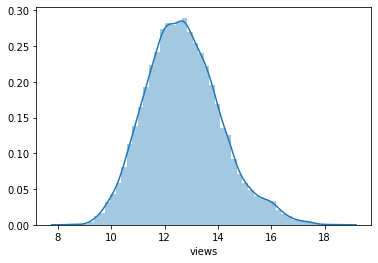

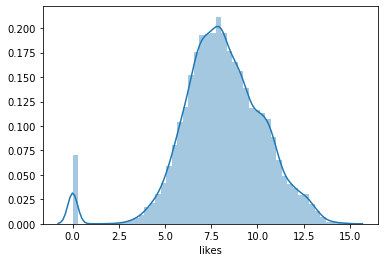

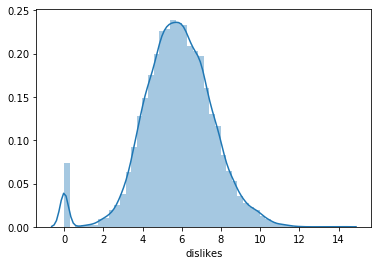

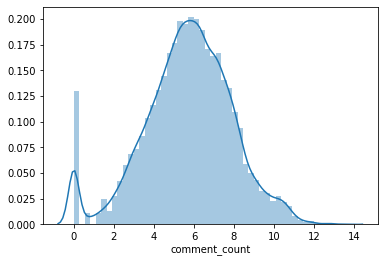

In [25]:
# Now, let's take a look at the distributions of all numerical attributes
num_cols = ['views','likes','dislikes','comment_count']
for i in num_cols:
    plt.figure()
    sns.distplot(np.log(df[i]+1))
    plt.show()

### By above plots, it can be inferred that all numerical atrributes have a log-normal distribution

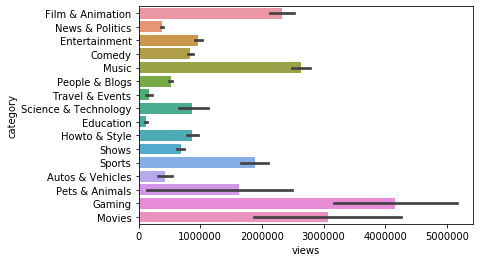

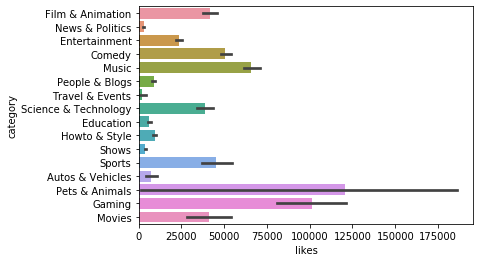

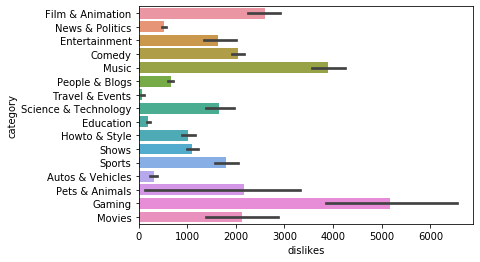

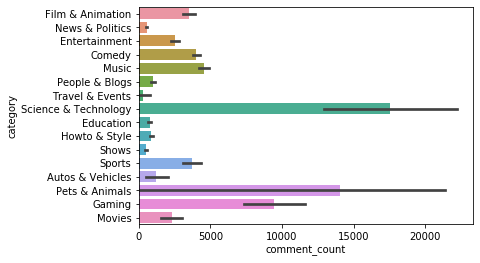

In [29]:
for i in num_cols:
    sns.barplot(df[i], df['category'])
    plt.show()

## Takeaway Points
#### 1. Gaming videos are the most  viewed videos among trending videos.
#### 2. Education videos are most less viewed videos among all trending videos.
#### 3. Pets&Animals videos are most liked videos among all trending videos.
#### 4. Gaming videos are most disliked videos among all trending videos.
#### 5. Science&Tech videos are most commented videos among all trending videos.
#### 6. Travel&Events videos are most less commented videos among all trending videos.

## Box Plots With Plotly

In [48]:
import plotly.express as px


fig = px.box(df, x="category", y="views")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

### Takeaway Points:
### 1. There are a lot of outliers present in the Entertainment category, also most viewed video is from Entertainment category.
### 2. Most viewed video is from entertainment category having 125 million views

In [71]:
fig = px.box(df, x="category", y="likes")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

### Takeaway Points:
### 1. As expected, most liked video is also from entertainment category and  chances are high that it's the same video having highest no. of views.

In [50]:
fig = px.box(df, x="category", y="dislikes")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

### Most Disliked Video is also from entertainment category

In [51]:
fig = px.box(df, x="category", y="comment_count")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

### 1.Most commented video is also from the entertainment category and chances are very high that one particular video have highest no of views,likes,dislikes and comments.
### 2. Hence, it can be inferred that if a video have very high views, there are more chances that it could be most liked,disliked and commented video

In [52]:
df['like_dislike_ratio'] = df['likes'] / df['dislikes']
df.head()

,category,views,likes,dislikes,comment_count,like_dislike_ratio
0,Film & Animation,1096327,33966,798,882,42.563910
1,News & Politics,590101,735,904,0,0.813053
2,Entertainment,473988,2011,243,149,8.275720
3,Comedy,1242680,70353,1624,2684,43.320813
4,Entertainment,464015,492,293,66,1.679181


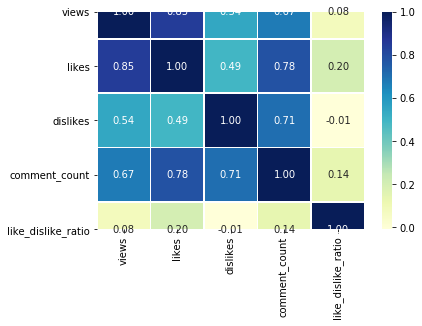

In [73]:
corr_mat = df.corr()
sns.heatmap(corr_mat, annot=True, linewidths=0.5, fmt='.2f', cmap='YlGnBu')
plt.show()

### From above plot, we can see a very strong positive correlation between views vs likes and comment_count vs likes.

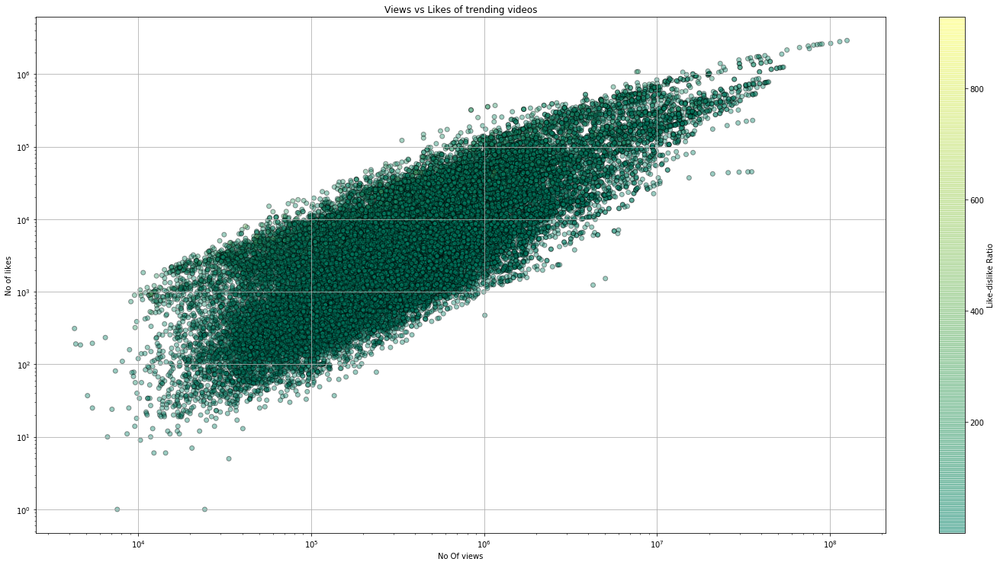

In [70]:
# Let's plot a scatter plot to visualize relationship between Views and Likes.
plt.figure(figsize=(20,10))
plt.scatter(df['views'], df['likes'], c=df['like_dislike_ratio'], cmap='summer', edgecolor='black',
           linewidth=1, alpha=0.4)
cbar = plt.colorbar()
cbar.set_label('Like-dislike Ratio')
plt.xscale('log')
plt.yscale('log')
plt.tight_layout()
plt.title('Views vs Likes of trending videos')
plt.xlabel('No Of views')
plt.ylabel('No of likes')
plt.grid()
plt.show()

### 1.From above plot, it can be inferred that as views on a video increases, no of likes also increases linearly.
### 2.The colorbar indicates the intensity of like-dislike ratio more bluish the color,more liked the video is.
### 3.As all these are trending videos,they have generally very high no of likes as comapred to dislikes.